<a href="https://colab.research.google.com/github/erica8494/Zero-To-Mastery/blob/master/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multil-class Dog Breed Classiciation

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given the image of the dog.

> When I'm setting at the cafe and I take a photo of a dog, i want to know what breed of dog it is, this will do that!

## 2. Data

The data we're using is from Kaggle's dog breed identification competition:
 https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dof breed of each test image:

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 dog breeds of dog (this means there are 120 different classes).
* There are around 10,000+ images int he training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them)

## Get our workspace ready

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're usign a GPU

In [ ]:
# Import TensorFlow and TensorFlow Hub into Colab
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:', tf.__version__)
print('TF Hub version:', hub.__version__)

# Check for CPU avilability -> change in the RunTime menu
print('GPU','aviliable (YESSSSSS!!!!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

TF version: 2.14.0
TF Hub version: 0.15.0
GPU aviliable (YESSSSSS!!!!)


## Getting our data ready (turing it into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we'll be doing that first, by turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
# Check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Dog_Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head(5))

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

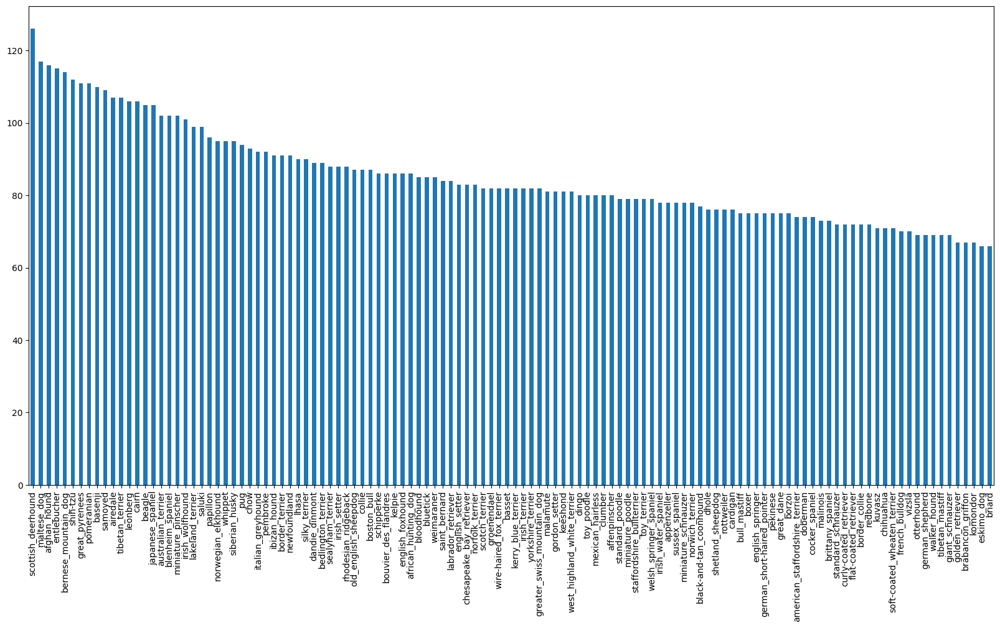

In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

> Note: that we need at min 10 images per class. Though it is recommended to have about 100. On average we have about 85 per class in this project

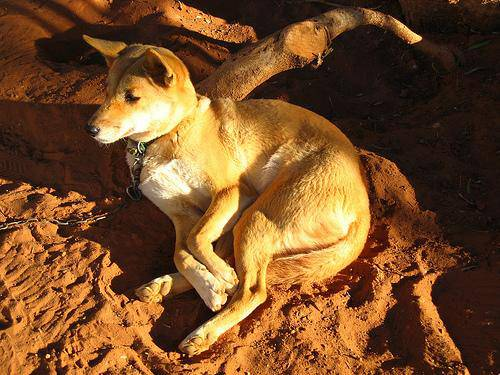

In [ ]:
# Let's view an image
from IPython.display import Image
Image('drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

## Getting image and their labels

Let's get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames form image ID's
filenames = ['drive/MyDrive/Dog_Vision/train/' + fname +'.jpg' for fname in labels_csv['id']]

filenames[:10]

['drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog_Vision/train/')) == len(filenames):
  print('Filenames match actual amount of files!! Proceed.')
else:
  print('Filenames do not match actual amount of files, check the target directory.')

Filenames match actual amount of files!! Proceed.


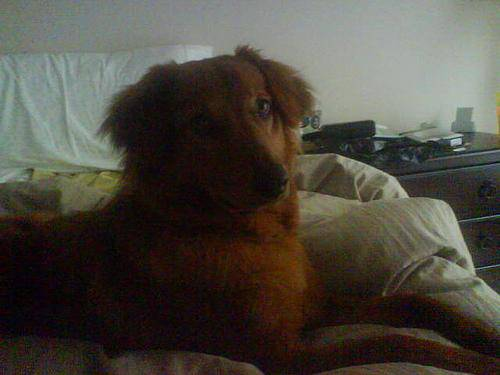

In [ ]:
# One more check
Image(filenames[1000])

In [ ]:
labels_csv['breed'][1000]

'irish_setter'

Since we've now got our training image filepath in a list, let's preparte our lables.

In [ ]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels[:5]

# a second method to do this would have been labels = labels_csv['breed'].to_numpy()

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever'],
      dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
len(filenames)

10222

In [ ]:
# Check if number of lables mataches the number of file names
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels does not match number of filenames, check data directories!')

Number of labels matches number of filenames!


In [ ]:
# Find the unique lables values
unique_breeds = np.unique(labels)
len(unique_breeds) # should be 120

120

In [ ]:
# Turn a single lables into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where lable occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[:2])
print(boolean_labels[2].astype(int))

['boston_bull' 'dingo']
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from kaggle does not come with a validation set we will create our own

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

> NOTE: when we are training on images it takes a long time if we are going to do so on 10,000+.

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images for experiementing
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Look to see what they look like
X_train[:5], y_train[:5]

(['drive/MyDrive/Dog_Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog_Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog_Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog_Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog_Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as imput
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be shape (224,224)
6. Return the modified `image`

Before we do, let's see what importing an image looks like

In [ ]:
# Convert an image to a numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
# Turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them, using the steps from above:
1. Take an image filepath as imput
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be shape (224,224)
6. Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns it into a Tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn jpg into numerical tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel value from 0-255 to 0-1 values to normalize
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning our data into batches

This is the best way to process our data since there are a lot of images this takes smaller portions so that they will all fit into memory.

Best is about 32 (batch size) images at a time (though you can change this as needed)

In order to use TensorFlow effectively, we need our data in the form of Tensor typles which looks like `(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """

  image = process_image(image_path)
  return image, label

In [ ]:
# quick demo from above function
process_image(X[42], tf.constant(y[42]))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we've got a way to turn our data into tuples of Tensors into the form: `(image, label)`, let's amke a function to turn all of our data into batches of 32!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, val_data=False, test_data=False):
  '''
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # If the data is a test dataset, we won't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif val_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  #filepath
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster then suffling images
    data = data.shuffle(buffer_size=len(X))

    # Creat (image, label) tuples (turns the iamge path into a preprocessed image)
    # Create our mini batches
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, val_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however these can be a little hard to understand/comprehend so we will visualize thenm!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Display a plot of 25 images and their labels from a data batch.
  '''
  # Set up the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')

In [ ]:
# this takes the first batch off the top
train_images, train_labels = next(train_data.as_numpy_iterator())

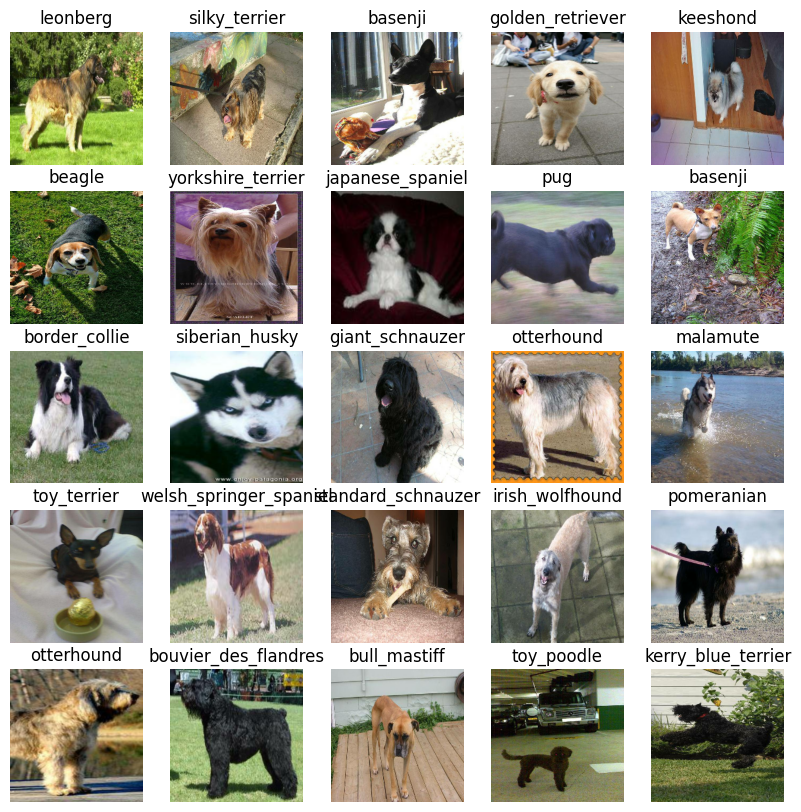

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

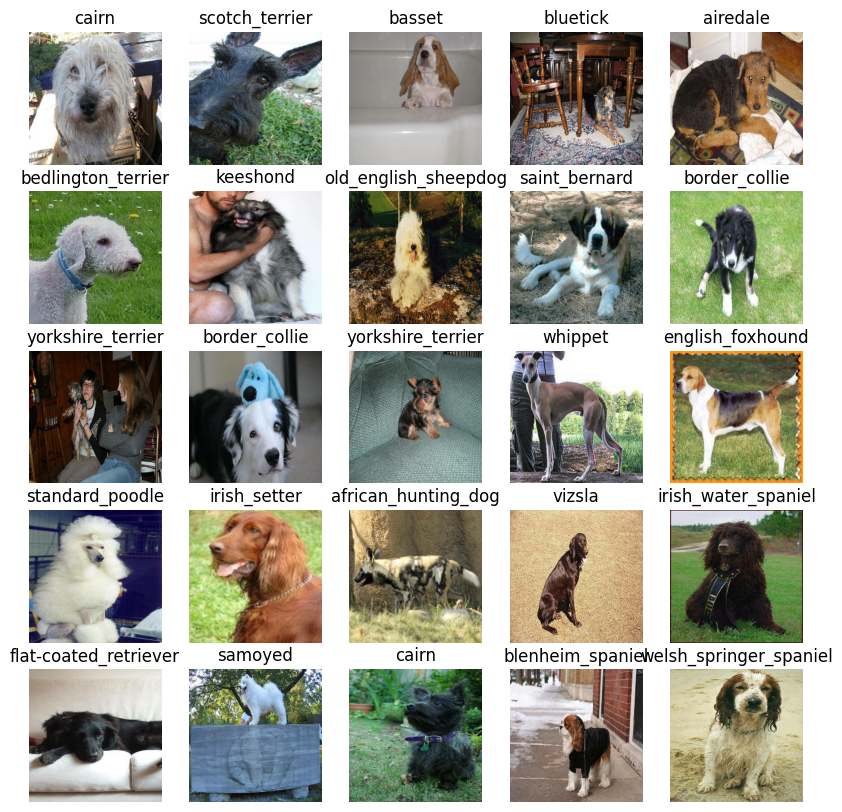

In [ ]:
# Now let's visualize the data in a validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* The input shape (our image shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model
* The URL of the model we want to use from TensorFlow Hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup inpet shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'


Now we've got our inputs, outputs, and model ready to go. Let's put them together into Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape, and the model we've choseen as parameters.
* Defines the layers in a Keras model in sequential fashion.
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

> All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a Keras sequential model
def create_model (input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
          hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
          tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                activation='softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


**Quick Note for Keras Model:**
>For a Binary Classification problem it is best to use Sigmoid (as Activation type) and Binary Crossentropy (as the Loss type).

> For a Multi-class Classification problem it is best to use Softmax (as the Activation type) and Categorical Crossentropy (as the Loss type).

More information on choosing a loss model: https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/


## Creating Model Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its' progress or stop training early if a model stops improving.

We'll create two callbacks:
1. For TensorBoard which helps track our models progress.
2. For early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback we will need to do these three things:
1. Load the TensorBoard notebook extension - allows us to see what is going on as the model runs in the actual notebook
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model training logs with the `%tensorboard` magic function - we will do this after model training.

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# so we can track each experiement and when it was run
import datetime

# Create a function to build a TensorBoard callback
def tensorboard_callback():
  # Create a log directory for storing the TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog_Vision/logs',
                        # Make it so that the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

**Quick note on Early Stopping Callback**
> We were more worried about the accuracy of the model but instead of focusing on the loss but we could have also done that here for what we are monitoring.

## Training a model (on a subest of data)

Our first model is only going to train on 1,000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 99 #@param {type:'slider', min:10, max:100, steps:10}

In [ ]:
# Check to make sure we are still running on a GPU
print('GPU', 'available (YES!!)' if tf.config.list_physical_devices('GPU') else 'not availiable:()')

GPU available (YES!!)


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `tensorboard_callback()`
*Call the `fit()` function on our model passing it rhe training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = tensorboard_callback()

  # Fit the model to the data passing it the training data
    # note that the validation_freq is how offten to test the patterns found on the val set
    # setting this to 1 means test once an epoch
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
import os
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/99
25/25 [==============================] - 86s 3s/step - loss: 4.6583 - accuracy: 0.1150 - val_loss: 3.4148 - val_accuracy: 0.2550
Epoch 2/99
25/25 [==============================] - 4s 168ms/step - loss: 1.7023 - accuracy: 0.6687 - val_loss: 2.1522 - val_accuracy: 0.5100
Epoch 3/99
25/25 [==============================] - 3s 104ms/step - loss: 0.5834 - accuracy: 0.9375 - val_loss: 1.6452 - val_accuracy: 0.6100
Epoch 4/99
25/25 [==============================] - 3s 110ms/step - loss: 0.2578 - accuracy: 0.9887 - val_loss: 1.4657 - val_accuracy: 0.6350
Epoch 5/99
25/25 [==============================] - 3s 109ms/step - loss: 0.1485 - accuracy: 0.9975 - val_loss: 1.3838 - val_accuracy: 0.6650
Epoch 6/99
25/25 [==============================] - 3s 141ms/step - loss: 0.1020 - accuracy: 1.0000 - val_loss: 1.3416 - val_accuracy: 0.6550
Epoch 7/99
25/25 [==============================] - 4s 16

### Checking the TensorBoard logs

The Tensoroard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its' contents.

In [ ]:
%tensorboard --logdir  drive/MyDrive/Dog_Vision/logs
# from tensorboard import notebook
# notebook.list() # View open TensorBoard instances
# notebook.start("--logdir drive/MyDrive/Dog_Vision/logs")

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 46s 82ms/step


array([[8.0518209e-04, 9.3447932e-05, 3.3263154e-03, ..., 1.0158919e-04,
        5.5523265e-05, 4.0849582e-03],
       [2.6013998e-03, 1.4423546e-03, 6.2743886e-03, ..., 2.9450381e-04,
        2.0003619e-03, 1.5518646e-04],
       [1.5884942e-05, 2.2608567e-04, 1.4388563e-05, ..., 3.9659426e-04,
        3.4829307e-05, 2.5881623e-04],
       ...,
       [1.5445139e-05, 3.7148953e-04, 2.6236047e-04, ..., 3.6934962e-05,
        3.2635379e-04, 8.6211902e-04],
       [2.9860849e-03, 1.0374018e-04, 5.4186361e-04, ..., 1.2590014e-04,
        1.1682078e-04, 8.8147409e-03],
       [3.5105561e-04, 1.1154928e-04, 5.0582839e-03, ..., 1.5741094e-03,
        7.8214618e-04, 2.7690694e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
# First Prediction
index = 5
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[1.76114136e-05 4.16493931e-05 1.10380177e-04 2.29748827e-03
 2.06852819e-05 2.29044599e-04 3.50301561e-05 3.33403659e-05
 7.31322507e-05 2.25945096e-05 9.78988290e-01 5.41772242e-05
 8.75768455e-05 8.92913340e-06 2.55024606e-05 2.66502320e-04
 3.03021661e-05 3.75923009e-05 3.84553423e-05 1.69820159e-05
 1.20395489e-05 9.11361494e-05 6.91443029e-06 1.48874242e-04
 2.49148696e-04 1.39697577e-05 1.23979489e-05 9.58921373e-06
 2.05747419e-04 6.25010534e-06 5.05502567e-06 1.22153739e-04
 7.71845080e-05 7.73136562e-05 3.61917802e-04 2.19602603e-04
 3.63840045e-05 7.49029496e-05 1.46513761e-04 3.37834026e-05
 4.88789010e-05 5.51364537e-05 6.91548339e-05 8.78878491e-05
 2.83722329e-05 1.17567906e-04 2.75494335e-06 2.40988811e-04
 2.82619712e-05 1.05479696e-04 2.42809310e-05 3.37023739e-05
 4.23815582e-05 1.35404131e-04 1.02143649e-05 8.16166284e-04
 5.17951630e-05 3.59185942e-04 4.03169455e-04 8.58485699e-04
 1.64787663e-04 1.34116781e-04 1.30057697e-05 2.09084556e-06
 3.45145847e-04 1.811955

Having the above functionality is great but we want to be able to do it at scale.
And it would be even better if we could see the image the prediction is being made on!

**Note:** Precition probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities into their respective lable (easier to understand)

def get_pred_label(prediction_pros):
  '''
  Turns an array of prediction probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_pros)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[10])
pred_label

'lakeland_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images then compare those predictions to the validation labels (

In [ ]:
# Create a function to unbatch a batch dataset


def unbathcify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate
  arrays of images and labels.
  '''
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation dataset

val_images, val_labels = unbathcify(val_data)

val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
p = val_labels[0]
np.argmax(val_labels[0])
unique_breeds[np.argmax(val_labels[0])]
p

'cairn'

Now we've got ways to get the following:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make a function to make these all a bit more visuaal.

We'll create a function which:
* Takes an array of prediction probabilitie, an array of truth lable, and an array of image and integer.
* Convert the prediction probabilities to predicted label.
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(pre_probs, labels, images, n=1):
  '''
  View the prediction, ground through, and image for sample n
  '''
  pred_prob, true_label, image = pre_probs[n], labels[n], images[n]

  # Get the pred label
  pred_label =  get_pred_label(pred_prob)

  # Plot image & remove tricks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                 np.max(pred_prob)*100,
                                 true_label),
            color=color)


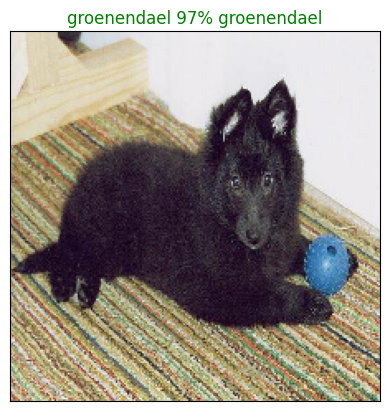

In [ ]:
plot_pred(pre_probs=predictions,
          labels = val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's amke another function to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  - Prediction proabilities idexes
  - Prediction proabilities values
  - Prediction labels
* Plot the top 10 prediction proability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(pred_probs, labels, n=1):
  '''
  Plot the top 10 highest prediction confidences along with the truth
  lable for sample n
  '''

  pred_prob, true_label = pred_probs[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top10_ind = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top10_vals = pred_prob[top10_ind]

  # Find the top 10 prediction labels
  top10_labs = unique_breeds[top10_ind]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top10_labs)),
                     top10_vals,
                     color='grey')
  plt.xticks(np.arange(len(top10_labs)),
             labels=top10_labs,
             rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top10_labs):
    top_plot[np.argmax(top10_labs == true_label)].set_color('green')
  else:
    pass



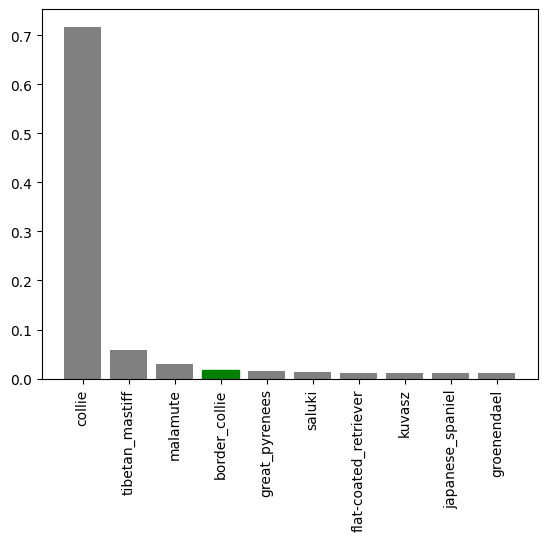

In [ ]:
plot_pred_conf(pred_probs=predictions,
               labels=val_labels,
               n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few!

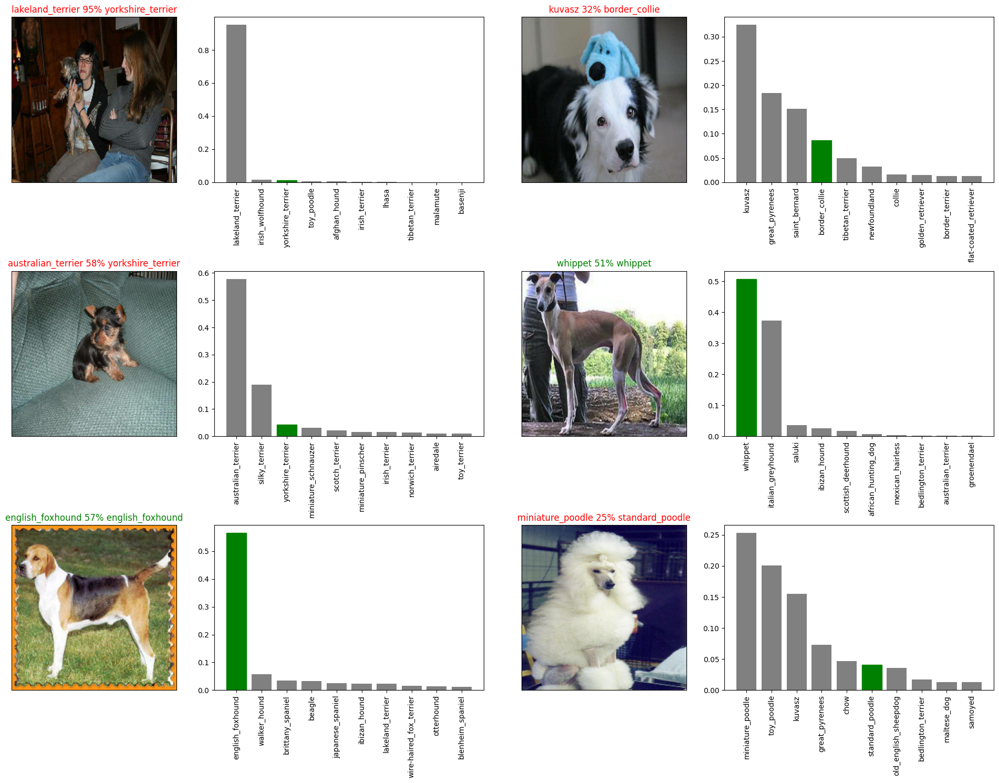

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(pre_probs=predictions,
            labels = val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(pred_probs=predictions, labels = val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saveing and reloading our trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a model directory and appends a suffix (string)
  '''

  # Create a model directory pathname with current time
  modeldir = os.path.join('drive/MyDrive/Dog_Vision/Models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save formate of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f"Loading a model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

> Now we have functions to save and load our model, let;s make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix='1000_images_mobilenetv2_Adam')

Saving model to: drive/MyDrive/Dog_Vision/Models/20231129-15381701272281-1000_images_mobilenetv2_Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_Vision/Models/20231129-15381701272281-1000_images_mobilenetv2_Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog_Vision/Models/20230927-00491695775777-1000_images_mobilenetv2_Adam.h5')

Loading a model from: drive/MyDrive/Dog_Vision/Models/20230927-00491695775777-1000_images_mobilenetv2_Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 80ms/step - loss: 1.2848 - accuracy: 0.6650


[1.284810185432434, 0.6650000214576721]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 102ms/step - loss: 1.2121 - accuracy: 0.7050


[1.2121015787124634, 0.7049999833106995]

## Training a big dog model on the full data!!

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = tensorboard_callback()

# No validation set when training on all the data
  # so we can't monitor the accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) becase the GPU we're using in the runtime has to load all of the images into memory

In [ ]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/99
320/320 [==============================] - 783s 2s/step - loss: 1.3336 - accuracy: 0.6711
Epoch 2/99
320/320 [==============================] - 31s 98ms/step - loss: 0.4015 - accuracy: 0.8808
Epoch 3/99
320/320 [==============================] - 30s 93ms/step - loss: 0.2335 - accuracy: 0.9381
Epoch 4/99
320/320 [==============================] - 31s 98ms/step - loss: 0.1535 - accuracy: 0.9629
Epoch 5/99
320/320 [==============================] - 31s 95ms/step - loss: 0.1062 - accuracy: 0.9793
Epoch 6/99
320/320 [==============================] - 31s 98ms/step - loss: 0.0760 - accuracy: 0.9860
Epoch 7/99
320/320 [==============================] - 30s 92ms/step - loss: 0.0589 - accuracy: 0.9927
Epoch 8/99
320/320 [==============================] - 30s 93ms/step - loss: 0.0463 - accuracy: 0.9942
Epoch 9/99
320/320 [==============================] - 31s 97ms/step - loss: 0.0373 - accuracy: 0.9959
Epoch 10/99
320/320 [==============================] - 31s 97ms/step - loss: 0.0306

In [ ]:
save_model(full_model, suffix='full_image_set_mobilenetv2_Adam')

Saving model to: drive/MyDrive/Dog_Vision/Models/20230927-01231695777808-full_image_set_mobilenetv2_Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog_Vision/Models/20230927-01231695777808-full_image_set_mobilenetv2_Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog_Vision/Models/20230927-01231695777808-full_image_set_mobilenetv2_Adam.h5')

Loading a model from: drive/MyDrive/Dog_Vision/Models/20230927-01231695777808-full_image_set_mobilenetv2_Adam.h5


## Making predictins on the test dataset

Since our model has been trained on images oin the form of Tensor batches, to make predictions ont he test data, we'll have to get it into the same format.

Luckily we have created a function (`create_data_batches`) eairlier which can take a list of filenames as input and convert them into Tensor batchs.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
from tables.tests.common import test_filename
import os
# Load test image filenames
test_path = 'drive/MyDrive/Dog_Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog_Vision/test/e1fa4eb8a57184773ac11efe0de11e92.jpg',
 'drive/MyDrive/Dog_Vision/test/e383a31009f0779536d43816c10bf662.jpg',
 'drive/MyDrive/Dog_Vision/test/dd3ac0ab0e9328f1f4c1692947c17c09.jpg',
 'drive/MyDrive/Dog_Vision/test/e431adb273c1b705e6e85147990f355e.jpg',
 'drive/MyDrive/Dog_Vision/test/e62be234fa4a073e375af9f724261378.jpg',
 'drive/MyDrive/Dog_Vision/test/e103930a8a4416f076c81a51907a7512.jpg',
 'drive/MyDrive/Dog_Vision/test/df5e20faf083ef154fcd716dff396e1d.jpg',
 'drive/MyDrive/Dog_Vision/test/dcb9aeaf9f1a5c11e95509376d8788ca.jpg',
 'drive/MyDrive/Dog_Vision/test/e52a4321a8cb0dd3bcc8f4a68b75eee7.jpg',
 'drive/MyDrive/Dog_Vision/test/e7e9dd51302fe08c1c89a550e183cf07.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our fill model and passing it the test data batch will take a long time to run (about an hour)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 1113s 3s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt('drive/MyDrive/Dog_Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
# Load predictions (NumPy Array) from csv file
test_predictions = np.loadtxt('drive/MyDrive/Dog_Vision/preds_array.csv', delimiter=',')

test_predictions.shape

(10357, 120)

Now that we've got one function to visualize our mocels top prediction, let's make another to view our models top 10 predeictions.

This function will:
- Take an input of prediction probabilities array aand a ground truth array and an integer
-